In [1]:
!pip install catboost

In [2]:
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix,roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_predict, StratifiedKFold
from sklearn.base import clone
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from transformers import BertTokenizer, BertModel
import torch
from transformers import BertTokenizer
from transformers import TFBertModel
import tensorflow as tf
import lime
import lime.lime_tabular
import shap

In [3]:
# Load pre-trained BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [4]:
df = pd.read_csv("LLM.csv")


In [5]:
df.head()

,Text,Label
0,y r u always l8 to the meetings?,student
1,The project team embraced a user-centric desig...,ai
2,"i dont like dealing with risks, it's too stres...",student
3,"i dont worry about reliability, it's good enough",student
4,"i dont care about human-centered design, just ...",student


In [6]:
df.dropna(inplace=True)


In [7]:

from sklearn.preprocessing import LabelEncoder
# Instantiate LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the LabelEncoder on the Label column
df['Label'] = label_encoder.fit_transform(df['Label'])

In [8]:
df.head()

,Text,Label
0,y r u always l8 to the meetings?,1
1,The project team embraced a user-centric desig...,0
2,"i dont like dealing with risks, it's too stres...",1
3,"i dont worry about reliability, it's good enough",1
4,"i dont care about human-centered design, just ...",1


In [9]:
df['Label'].value_counts()

Label
0    552
1    550
Name: count, dtype: int64

In [10]:
index_to_delete = df[df['Label'] == 2].index

# Delete the row with the found index
df = df.drop(index_to_delete)

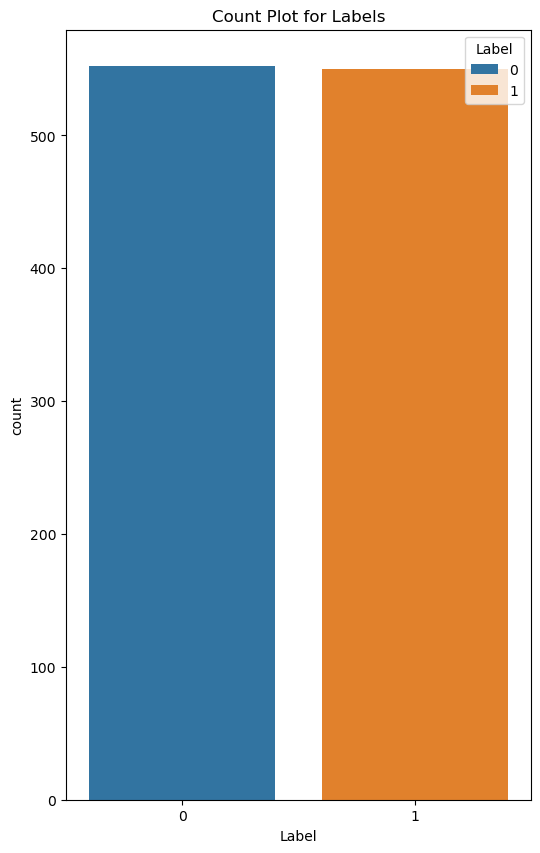

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Display the count plot for the 'Label' column
plt.figure(figsize=(6, 10))
sns.countplot(data=df, x='Label',hue = "Label" )
plt.title('Count Plot for Labels')
plt.xlabel('Label')
plt.savefig('count_plot_1.png') 
plt.show()



C:\Users\Jervis\AppData\Local\Temp\ipykernel_4632\3777336953.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['Label'], shade=True)


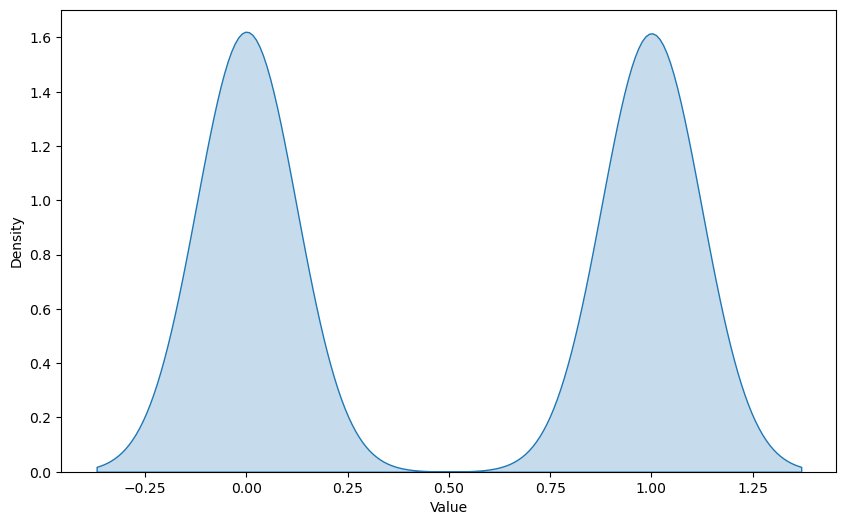

In [15]:
# Plot density plot for the 'label' column
plt.figure(figsize=(10, 6))
sns.kdeplot(df['Label'], shade=True)
plt.xlabel('Value')
plt.ylabel('Density')
plt.savefig('density_plot_1.png') 
plt.show()

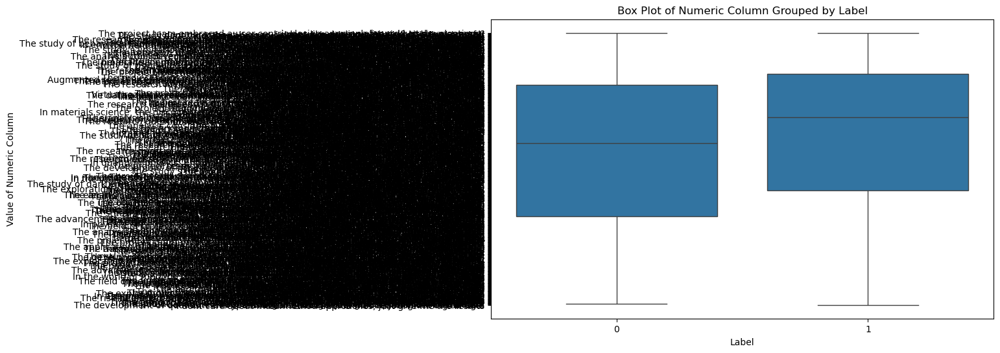

In [12]:
# Box plot for a numeric column (replace 'numeric_column' with the actual numeric column name)
df['Label'] = df['Label'].astype('category')
plt.figure(figsize=(10, 6))
sns.boxplot(x='Label', y='Text', data=df)
plt.title('Box Plot of Numeric Column Grouped by Label')
plt.xlabel('Label')
plt.ylabel('Value of Numeric Column')
plt.show()

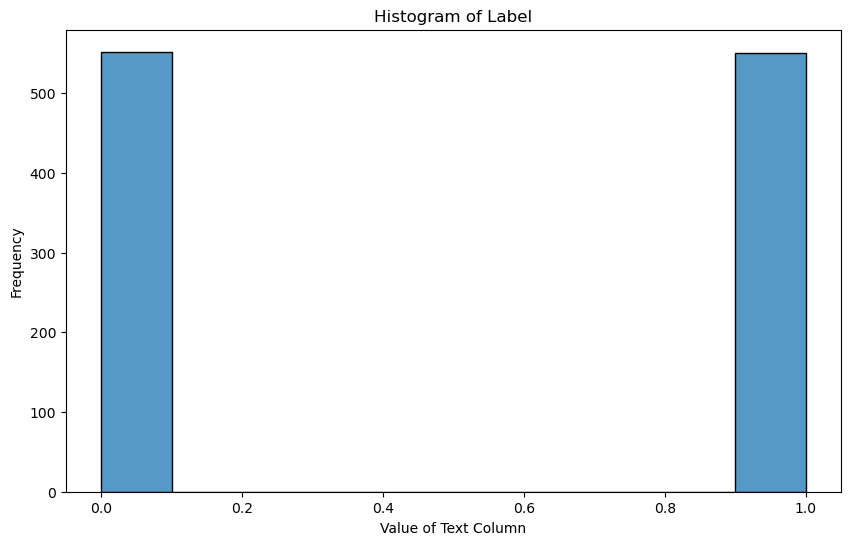

In [24]:
# Plot histogram for the 'Text' column
plt.figure(figsize=(10, 6))
sns.histplot(df['Label'], bins=10)  # kde=True adds a density plot
plt.title('Histogram of Label')
plt.xlabel('Value of Text Column')
plt.ylabel('Frequency')
plt.savefig('histogram_plot_1.png')
plt.show()

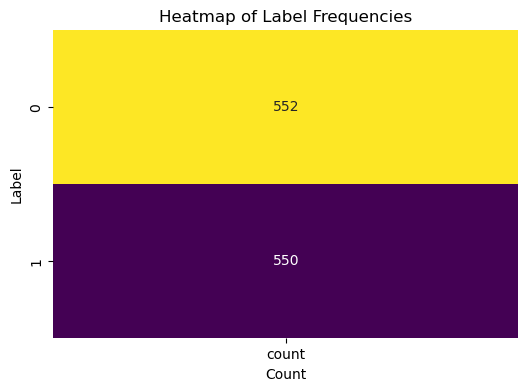

In [14]:
label_counts = pd.crosstab(index=df['Label'], columns="count")

# Plot the heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(label_counts, annot=True, fmt="d", cmap='viridis', cbar=False)
plt.title('Heatmap of Label Frequencies')
plt.xlabel('Count')
plt.ylabel('Label')
plt.show()

In [8]:
# Shuffle the dataset
df_permuted = df.sample(frac=1).reset_index(drop=True)

# Display the first few rows of the shuffled dataset
print(df_permuted.head())

                                                Text  Label
0  The research question is framed to address cur...      0
1  The analysis considered potential correlations...      0
2  The application of artificial intelligence in ...      0
3  The project team embraced a collaborative and ...      0
4  The research design minimizes the risk of inte...      0


In [13]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(df['Text'], df['Label'], test_size=0.2, random_state=60)

In [25]:
# Load pre-trained BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Tokenize the text data
def tokenize(texts, max_len=128):
    input_ids = []
    attention_masks = []

    for text in texts:
        encoded = tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=max_len,
            padding='max_length',
            truncation=True,
            return_attention_mask=True
        )

        input_ids.append(encoded['input_ids'])
        attention_masks.append(encoded['attention_mask'])

    return tf.convert_to_tensor(input_ids), tf.convert_to_tensor(attention_masks)

X_train_ids, X_train_masks = tokenize(X_train)
X_test_ids, X_test_masks = tokenize(X_test)

C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


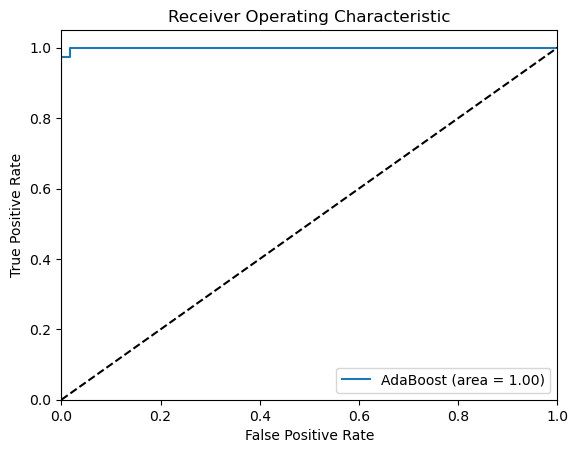

Accuracy: 0.9728506787330317
Precision: 0.9478260869565217
Recall: 1.0
F1 Score: 0.9732142857142857
Confusion Matrix:
[[106   6]
 [  0 109]]
ROC AUC: 0.9995085190039319


In [47]:
# Convert BERT embeddings to numpy arrays
X_train_embeddings = X_train_ids.numpy()
X_test_embeddings = X_test_ids.numpy()

# Train AdaBoost classifier
ada = AdaBoostClassifier(n_estimators=100, random_state=42)
ada.fit(X_train_embeddings, y_train)

# Make predictions
y_pred = ada.predict(X_test_embeddings)
y_prob = ada.predict_proba(X_test_embeddings)[:, 1]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob)
fpr, tpr, _ = roc_curve(y_test, y_prob)

# Plot ROC Curve
plt.figure()
plt.plot(fpr, tpr, label='AdaBoost (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'ROC AUC: {roc_auc}')

C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


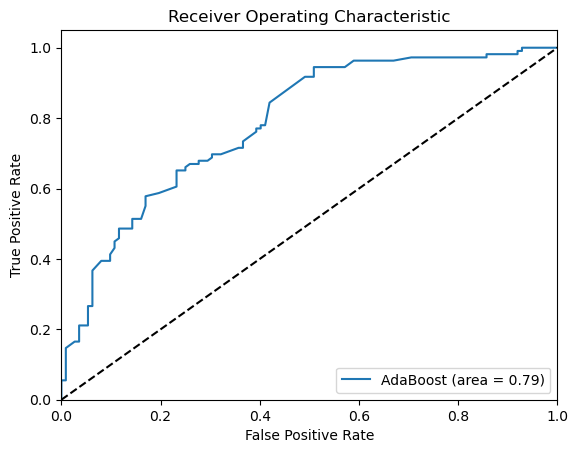

Accuracy: 0.6787330316742082
Precision: 0.6610169491525424
Recall: 0.7155963302752294
F1 Score: 0.9732142857142857
Confusion Matrix:
[[72 40]
 [31 78]]
ROC AUC: 0.7859600262123199


In [48]:
from sklearn.decomposition import PCA

# Apply PCA
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_embeddings)
X_test_pca = pca.transform(X_test_embeddings)

# Train AdaBoost on PCA-transformed data
ada_pca = AdaBoostClassifier(n_estimators=100, random_state=42)
ada_pca.fit(X_train_pca, y_train)

# Make predictions and evaluate
y_pred_pca = ada_pca.predict(X_test_pca)
y_prob_pca = ada_pca.predict_proba(X_test_pca)[:, 1]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_pca)
precision = precision_score(y_test, y_pred_pca)
recall = recall_score(y_test, y_pred_pca)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred_pca)
roc_auc = roc_auc_score(y_test, y_prob_pca)
fpr, tpr, _ = roc_curve(y_test, y_prob_pca)

# Plot ROC Curve
plt.figure()
plt.plot(fpr, tpr, label='AdaBoost (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'ROC AUC: {roc_auc}')


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


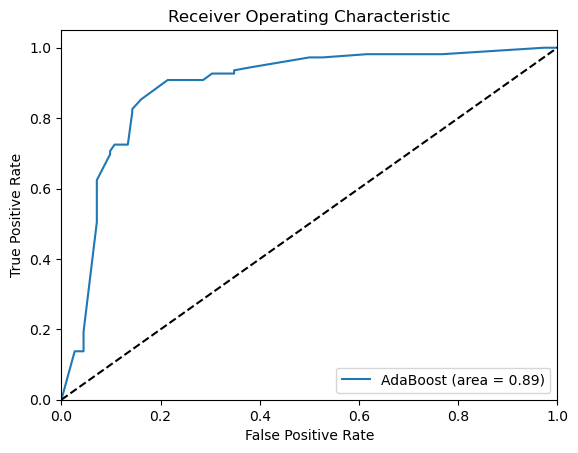

Accuracy: 0.8416289592760181
Precision: 0.8490566037735849
Recall: 0.8256880733944955
F1 Score: 0.8372093023255814
Confusion Matrix:
[[96 16]
 [19 90]]
ROC AUC: 0.8862221494102228


In [49]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# Apply LDA
lda = LDA(n_components=1)
X_train_lda = lda.fit_transform(X_train_embeddings, y_train)
X_test_lda = lda.transform(X_test_embeddings)

# Train AdaBoost on LDA-transformed data
ada_lda = AdaBoostClassifier(n_estimators=100, random_state=42)
ada_lda.fit(X_train_lda, y_train)

# Make predictions and evaluate
y_pred_lda = ada_lda.predict(X_test_lda)
y_prob_lda = ada_lda.predict_proba(X_test_lda)[:, 1]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_lda)
precision = precision_score(y_test, y_pred_lda)
recall = recall_score(y_test, y_pred_lda)
f1 = f1_score(y_test, y_pred_lda)
conf_matrix = confusion_matrix(y_test, y_pred_lda)
roc_auc = roc_auc_score(y_test, y_prob_lda)
fpr, tpr, _ = roc_curve(y_test, y_prob_lda)

# Plot ROC Curve
plt.figure()
plt.plot(fpr, tpr, label='AdaBoost (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'ROC AUC: {roc_auc}')

In [26]:
import lime
import lime.lime_tabular

# LIME for AdaBoost
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_embeddings, feature_names=[f'feature_{i}' for i in range(X_train_embeddings.shape[1])], class_names=['0', '1'], verbose=True, mode='classification')
i = 0  # Index of the sample to explain
exp = explainer.explain_instance(X_test_embeddings[i], ada.predict_proba, num_features=10)
exp.show_in_notebook(show_table=True, show_all=False)


Intercept 0.5467116168257129
Prediction_local [0.41537423]
Right: 0.41107638607213937


In [21]:
print(shap_values[1][0].shape)
print(X_test_embeddings[0].shape)


NameError: name 'shap_values' is not defined

In [ ]:


import shap

# Create a subset of background data samples
background_data_subset = shap.sample(X_train_embeddings, 100)  # Using 100 samples for background data

# Create SHAP explainer object using KernelExplainer with the subset of background data
explainer = shap.KernelExplainer(ada.predict_proba, background_data_subset)

# Generate SHAP values for the test data
shap_values = explainer.shap_values(X_test_embeddings)

# Visualize the SHAP summary plot
shap.summary_plot(shap_values, X_test_embeddings, title="SHAP Summary Plot for AdaBoostClassifier")


  0%|          | 0/221 [00:00<?, ?it/s]

In [54]:
def train_and_evaluate(model, X_train, y_train, X_test, y_test, model_name, reduction_technique="None"):
    model.fit(X_train, y_train)
    
    # Predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    # Calculate specificity
    tn, fp, fn, tp = conf_matrix.ravel()
    specificity = tn / (tn + fp)

    roc_auc = roc_auc_score(y_test, y_prob)
    fpr, tpr, _ = roc_curve(y_test, y_prob)

    # Print metrics
    print(f'[{model_name} - {reduction_technique}] Accuracy: {accuracy}')
    print(f'[{model_name} - {reduction_technique}] Precision: {precision}')
    print(f'[{model_name} - {reduction_technique}] Recall: {recall}')
    print(f'[{model_name} - {reduction_technique}] F1 Score: {f1}')
    print(f'[{model_name} - {reduction_technique}] Specificity: {specificity}')
    print(f'[{model_name} - {reduction_technique}] Confusion Matrix:\n{conf_matrix}')
    print(f'[{model_name} - {reduction_technique}] ROC AUC: {roc_auc}')

    # Plot ROC Curve
    plt.figure()
    plt.plot(fpr, tpr, label=f'{model_name} (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    # plt.title(f'Receiver Operating Characteristic - {model_name} - {reduction_technique}')
    plt.legend(loc="lower right")
    plt.show()

    # Plot Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title(f'Confusion Matrix')
    plt.show()

    return model


In [15]:
models = [
    ("AdaBoost", AdaBoostClassifier(n_estimators=100, random_state=42)),
    ("XGBoost", XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
    ("RandomForest", RandomForestClassifier(n_estimators=100, random_state=42)),
    ("SVM", SVC(probability=True, random_state=42)),
    ("CatBoost", CatBoostClassifier(verbose=0, random_state=42))
]


In [28]:
# Evaluate models without PCA/LDA
for name, model in models:
    train_and_evaluate(model, X_train_embeddings, y_train, X_test_embeddings, y_test, name, "None")


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - None] Accuracy: 0.9728506787330317
[AdaBoost - None] Precision: 0.9478260869565217
[AdaBoost - None] Recall: 1.0
[AdaBoost - None] F1 Score: 0.9732142857142857
[AdaBoost - None] Specificity: 0.9464285714285714
[AdaBoost - None] Confusion Matrix:
[[106   6]
 [  0 109]]
[AdaBoost - None] ROC AUC: 0.9995085190039319
[XGBoost - None] Accuracy: 0.9909502262443439
[XGBoost - None] Precision: 0.9819819819819819
[XGBoost - None] Recall: 1.0
[XGBoost - None] F1 Score: 0.990909090909091
[XGBoost - None] Specificity: 0.9821428571428571
[XGBoost - None] Confusion Matrix:
[[110   2]
 [  0 109]]
[XGBoost - None] ROC AUC: 0.9955766710353866
[RandomForest - None] Accuracy: 0.9864253393665159
[RandomForest - None] Precision: 0.9818181818181818
[RandomForest - None] Recall: 0.9908256880733946
[RandomForest - None] F1 Score: 0.9863013698630136
[RandomForest - None] Specificity: 0.9821428571428571
[RandomForest - None] Confusion Matrix:
[[110   2]
 [  1 108]]
[RandomForest - None] ROC AUC: 0.9

C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - PCA] Accuracy: 0.6787330316742082
[AdaBoost - PCA] Precision: 0.6610169491525424
[AdaBoost - PCA] Recall: 0.7155963302752294
[AdaBoost - PCA] F1 Score: 0.6872246696035242
[AdaBoost - PCA] Specificity: 0.6428571428571429
[AdaBoost - PCA] Confusion Matrix:
[[72 40]
 [31 78]]
[AdaBoost - PCA] ROC AUC: 0.7859600262123199


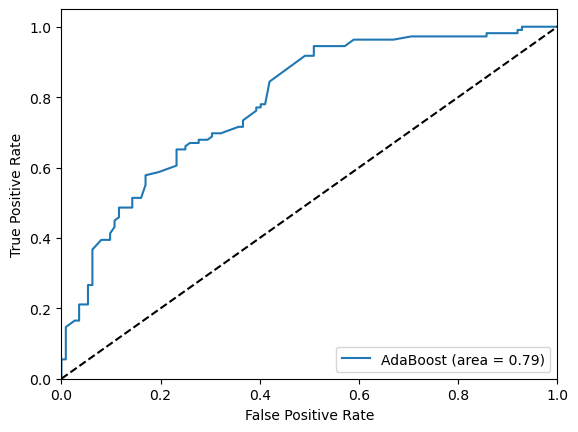

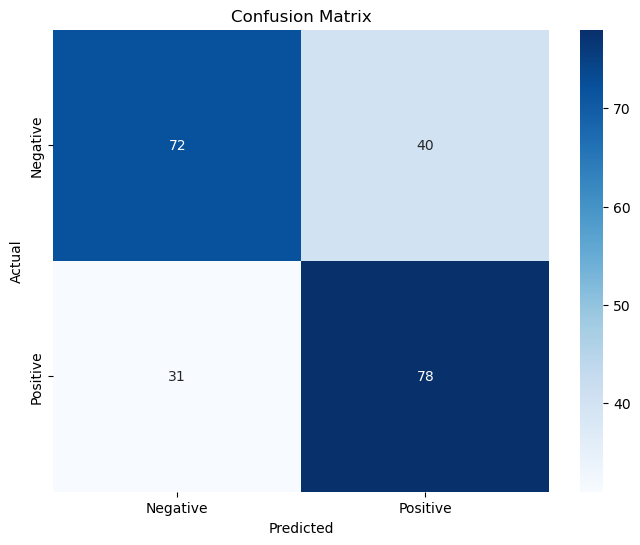

[XGBoost - PCA] Accuracy: 0.7918552036199095
[XGBoost - PCA] Precision: 0.7603305785123967
[XGBoost - PCA] Recall: 0.8440366972477065
[XGBoost - PCA] F1 Score: 0.8
[XGBoost - PCA] Specificity: 0.7410714285714286
[XGBoost - PCA] Confusion Matrix:
[[83 29]
 [17 92]]
[XGBoost - PCA] ROC AUC: 0.8700851900393185


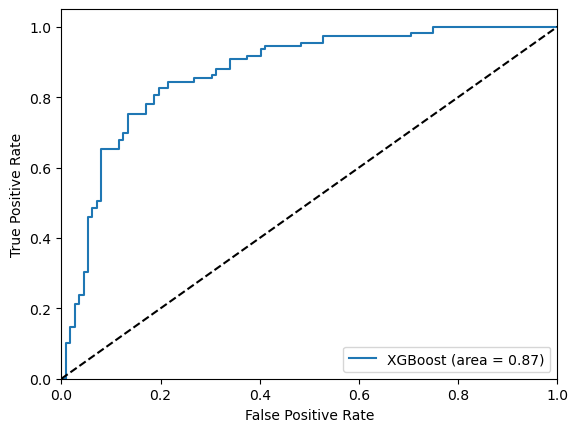

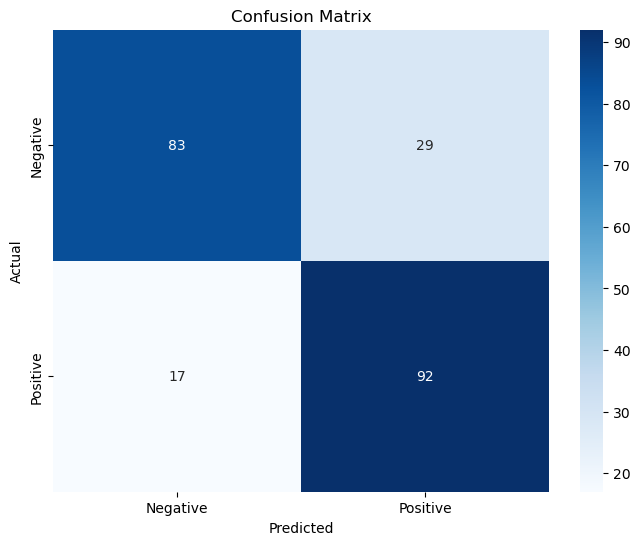

[RandomForest - PCA] Accuracy: 0.8009049773755657
[RandomForest - PCA] Precision: 0.782608695652174
[RandomForest - PCA] Recall: 0.8256880733944955
[RandomForest - PCA] F1 Score: 0.8035714285714286
[RandomForest - PCA] Specificity: 0.7767857142857143
[RandomForest - PCA] Confusion Matrix:
[[87 25]
 [19 90]]
[RandomForest - PCA] ROC AUC: 0.9279570773263434


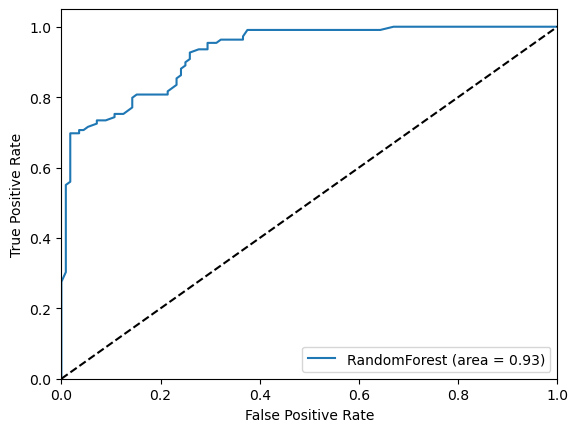

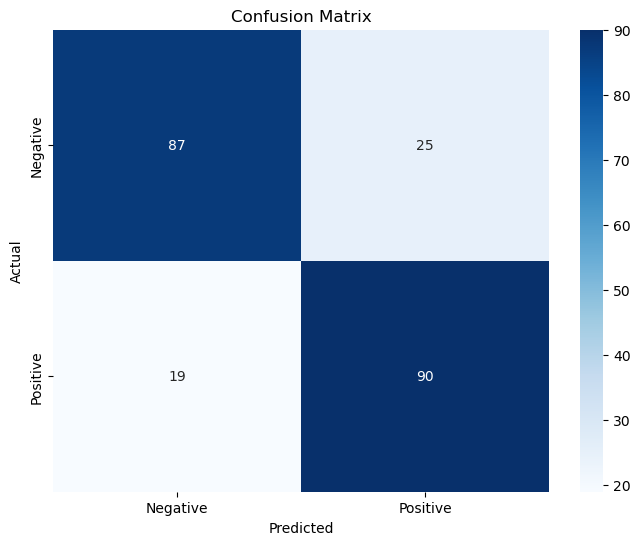

[SVM - PCA] Accuracy: 0.6380090497737556
[SVM - PCA] Precision: 0.5973154362416108
[SVM - PCA] Recall: 0.8165137614678899
[SVM - PCA] F1 Score: 0.689922480620155
[SVM - PCA] Specificity: 0.4642857142857143
[SVM - PCA] Confusion Matrix:
[[52 60]
 [20 89]]
[SVM - PCA] ROC AUC: 0.6838138925294889


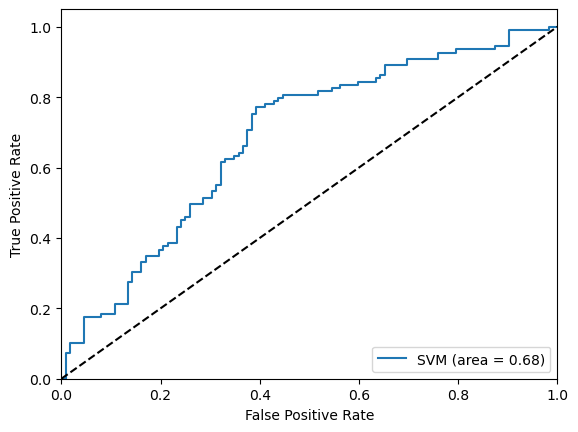

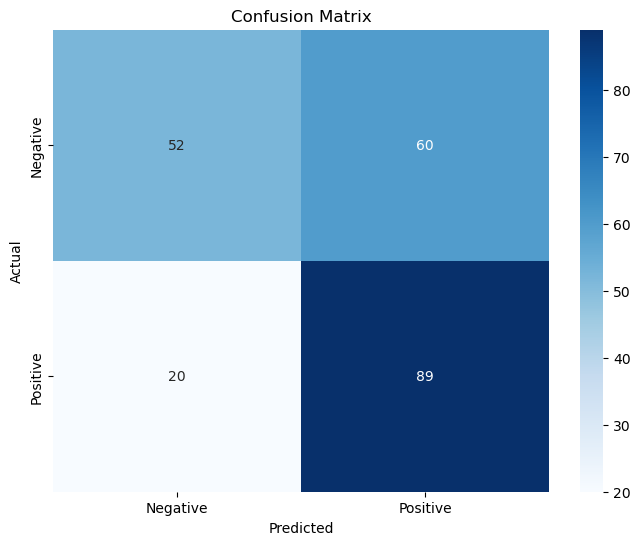

[CatBoost - PCA] Accuracy: 0.7918552036199095
[CatBoost - PCA] Precision: 0.7560975609756098
[CatBoost - PCA] Recall: 0.8532110091743119
[CatBoost - PCA] F1 Score: 0.8017241379310345
[CatBoost - PCA] Specificity: 0.7321428571428571
[CatBoost - PCA] Confusion Matrix:
[[82 30]
 [16 93]]
[CatBoost - PCA] ROC AUC: 0.8828636959370905


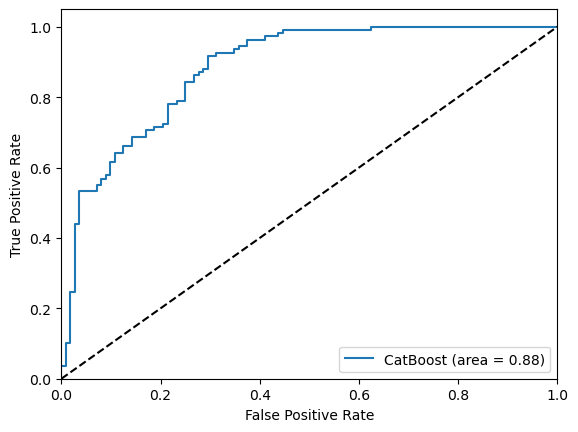

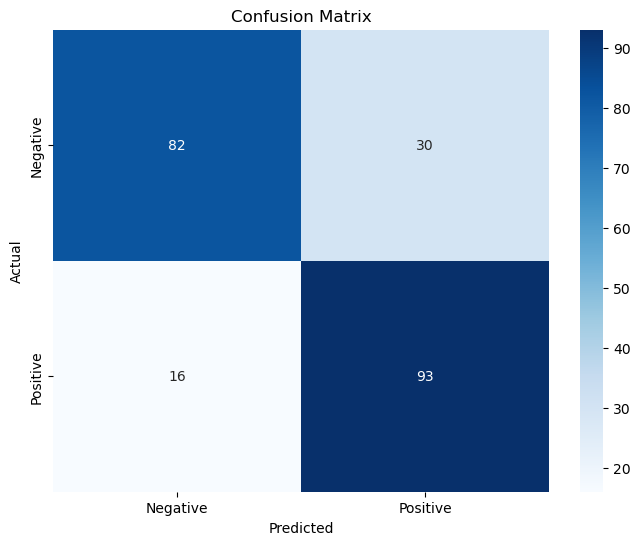

In [57]:
# Apply PCA
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_embeddings)
X_test_pca = pca.transform(X_test_embeddings)

# Evaluate models with PCA
for name, model in models:
    train_and_evaluate(clone(model), X_train_pca, y_train, X_test_pca, y_test, name, "PCA")


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - LDA] Accuracy: 0.8416289592760181
[AdaBoost - LDA] Precision: 0.8490566037735849
[AdaBoost - LDA] Recall: 0.8256880733944955
[AdaBoost - LDA] F1 Score: 0.8372093023255814
[AdaBoost - LDA] Specificity: 0.8571428571428571
[AdaBoost - LDA] Confusion Matrix:
[[96 16]
 [19 90]]
[AdaBoost - LDA] ROC AUC: 0.8862221494102228


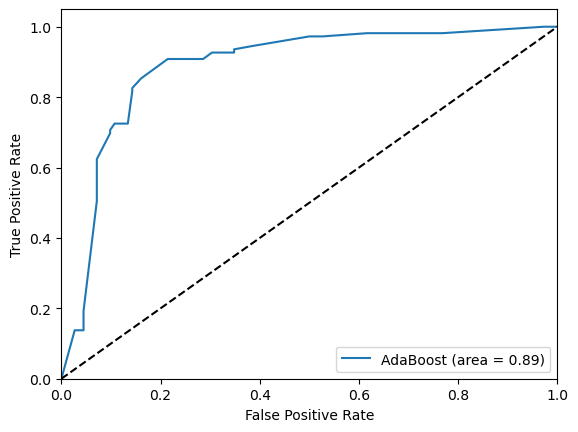

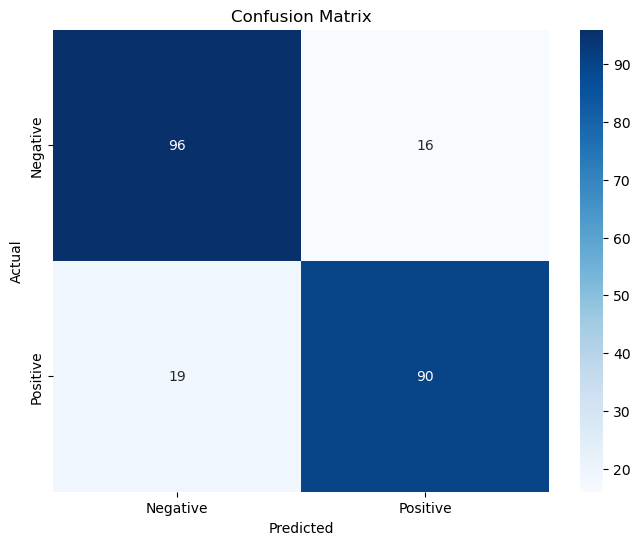

[XGBoost - LDA] Accuracy: 0.8597285067873304
[XGBoost - LDA] Precision: 0.8545454545454545
[XGBoost - LDA] Recall: 0.8623853211009175
[XGBoost - LDA] F1 Score: 0.8584474885844748
[XGBoost - LDA] Specificity: 0.8571428571428571
[XGBoost - LDA] Confusion Matrix:
[[96 16]
 [15 94]]
[XGBoost - LDA] ROC AUC: 0.8969528178243775


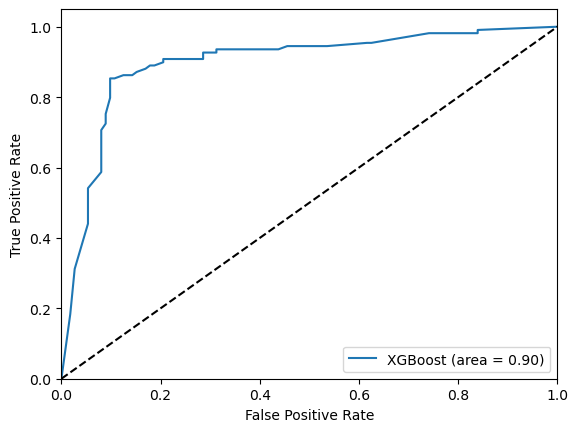

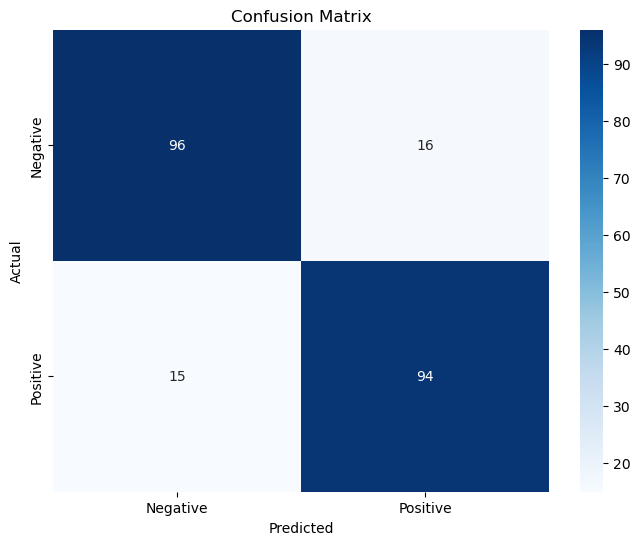

[RandomForest - LDA] Accuracy: 0.8823529411764706
[RandomForest - LDA] Precision: 0.8608695652173913
[RandomForest - LDA] Recall: 0.908256880733945
[RandomForest - LDA] F1 Score: 0.8839285714285714
[RandomForest - LDA] Specificity: 0.8571428571428571
[RandomForest - LDA] Confusion Matrix:
[[96 16]
 [10 99]]
[RandomForest - LDA] ROC AUC: 0.9001474442988204


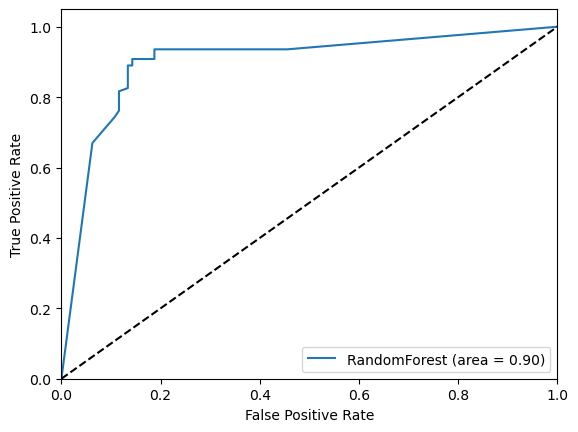

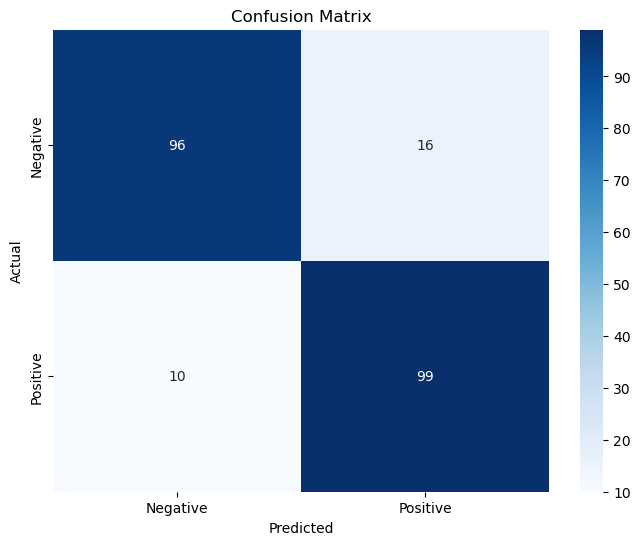

[SVM - LDA] Accuracy: 0.8235294117647058
[SVM - LDA] Precision: 0.7966101694915254
[SVM - LDA] Recall: 0.8623853211009175
[SVM - LDA] F1 Score: 0.8281938325991189
[SVM - LDA] Specificity: 0.7857142857142857
[SVM - LDA] Confusion Matrix:
[[88 24]
 [15 94]]
[SVM - LDA] ROC AUC: 0.8713138925294888


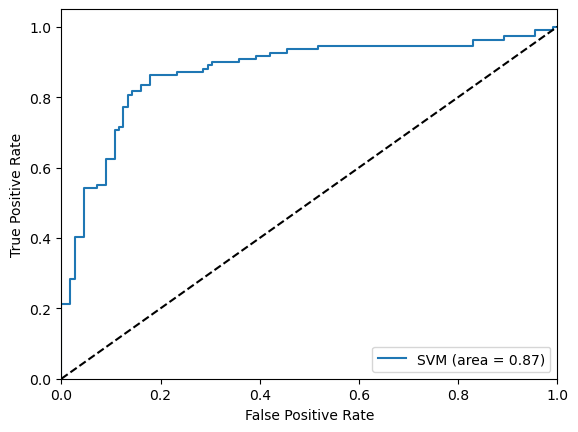

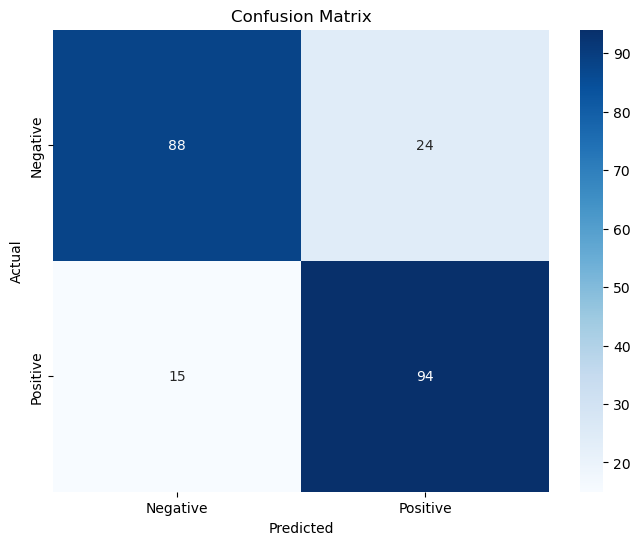

[CatBoost - LDA] Accuracy: 0.8687782805429864
[CatBoost - LDA] Precision: 0.8571428571428571
[CatBoost - LDA] Recall: 0.8807339449541285
[CatBoost - LDA] F1 Score: 0.8687782805429864
[CatBoost - LDA] Specificity: 0.8571428571428571
[CatBoost - LDA] Confusion Matrix:
[[96 16]
 [13 96]]
[CatBoost - LDA] ROC AUC: 0.8968709043250328


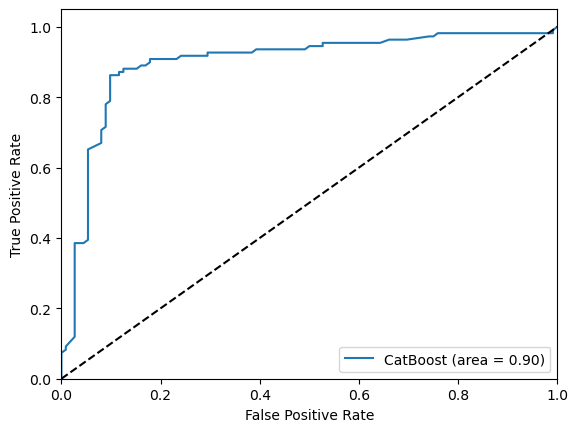

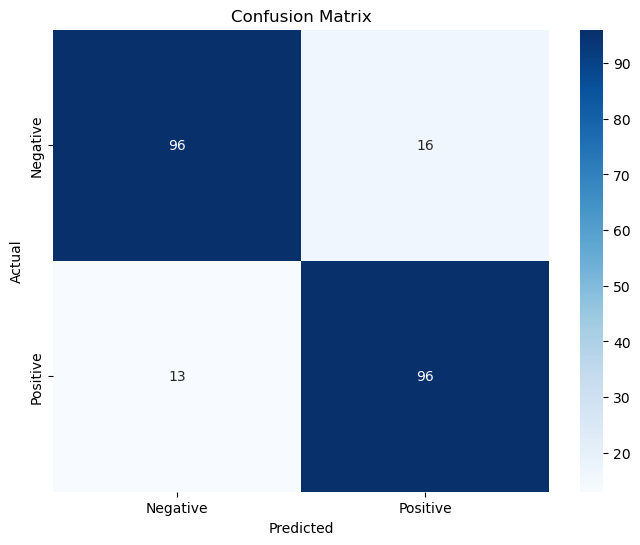

In [58]:
# Apply LDA
lda = LDA(n_components=1)
X_train_lda = lda.fit_transform(X_train_embeddings, y_train)
X_test_lda = lda.transform(X_test_embeddings)

# Evaluate models with LDA
for name, model in models:
    train_and_evaluate(clone(model), X_train_lda, y_train, X_test_lda, y_test, name, "LDA")


In [34]:
# LIME for all models
for name, model in models:
    model.fit(X_train_embeddings, y_train)
    lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train_embeddings, feature_names=[f'feature_{i}' for i in range(X_train_embeddings.shape[1])], class_names=['0', '1'], verbose=True, mode='classification')
    exp = lime_explainer.explain_instance(X_test_embeddings[0], model.predict_proba, num_features=10)
    exp.show_in_notebook(show_table=True, show_all=False)



C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Intercept 0.5656216799683502
Prediction_local [0.41327892]
Right: 0.41107638607213937


Intercept 0.9442887415523908
Prediction_local [0.9016081]
Right: 0.00078879343


Intercept 0.5590859600893212
Prediction_local [0.14586375]
Right: 0.05


Intercept 0.4059067186281686
Prediction_local [0.27537479]
Right: 0.017574639333606982


Intercept 0.916793167346255
Prediction_local [0.00612005]
Right: 0.0010014047920590074


In [33]:
 #Train the XGBoost model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train_embeddings, y_train)

# Make predictions
y_pred = xgb_model.predict(X_test_embeddings)
y_prob = xgb_model.predict_proba(X_test_embeddings)

In [34]:
# LIME for xgbBoost
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_embeddings, feature_names=[f'feature_{i}' for i in range(X_train_embeddings.shape[1])], class_names=['0', '1'], verbose=True, mode='classification')
i = 0  # Index of the sample to explain
exp = explainer.explain_instance(X_test_embeddings[i], xgb_model.predict_proba, num_features=10)
exp.show_in_notebook(show_table=True, show_all=False)


Intercept 1.0466423932338116
Prediction_local [0.89813515]
Right: 0.00078879343


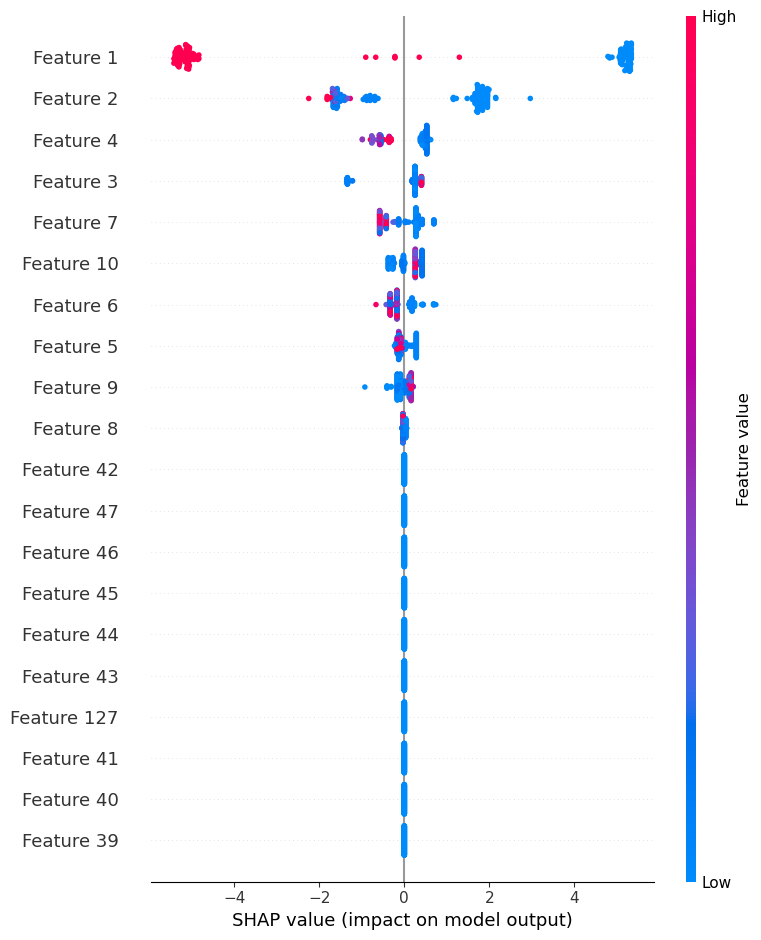

In [69]:
# Train the XGBoost model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train_embeddings, y_train)

# Make predictions
y_pred = xgb_model.predict(X_test_embeddings)
y_prob = xgb_model.predict_proba(X_test_embeddings)
# Compute SHAP values
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test_embeddings)

# Plot SHAP summary plot
shap.summary_plot(shap_values, X_test_embeddings)

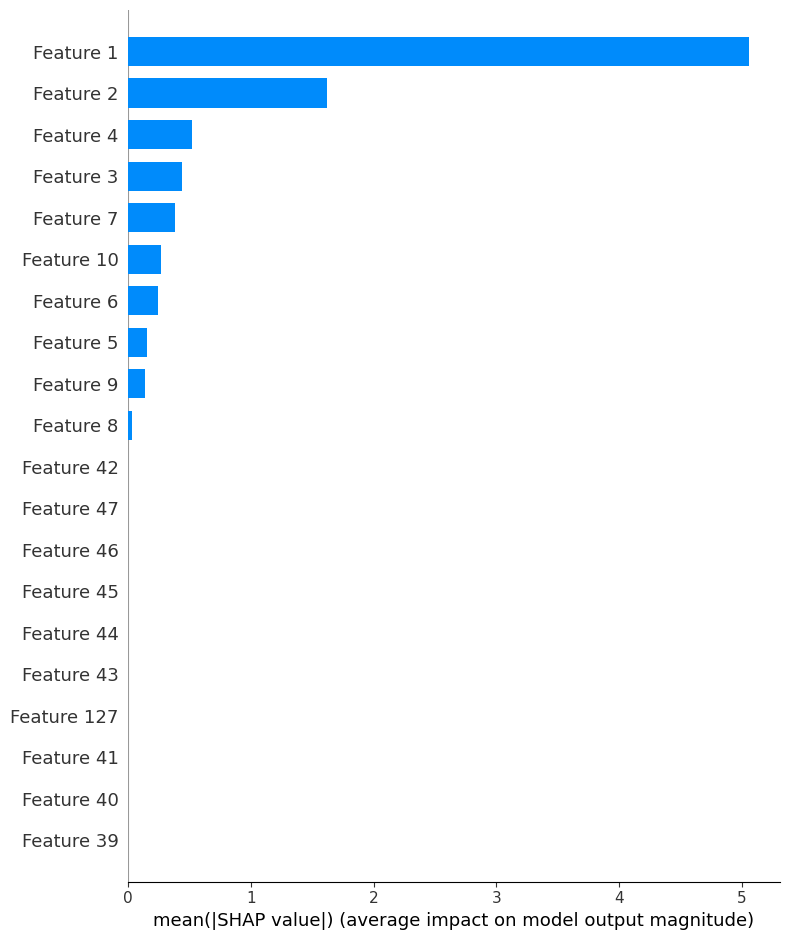

In [29]:
# Initialize the SHAP explainer with your model
explainer = shap.Explainer(xgb_model)

# Compute SHAP values for the test data
shap_values = explainer(X_test_embeddings)

# Plot mean SHAP values
shap.summary_plot(shap_values, X_test_embeddings, plot_type="bar")

In [23]:
# Define a function to train and evaluate models using k-fold cross-validation
def train_and_evaluate_kfold(models, X, y, n_splits=10):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=60)
    
    for name, model in models:
        metrics = {
            'accuracy': [],
            'precision': [],
            'recall': [],
            'f1': [],
            'roc_auc': []
        }

        fold = 1
        for train_index, test_index in skf.split(X, y):
            X_train_fold, X_test_fold = X[train_index], X[test_index]
            y_train_fold, y_test_fold = y[train_index], y[test_index]

            # Train the model
            clf = clone(model)
            clf.fit(X_train_fold, y_train_fold)
            
            # Predictions
            y_pred = clf.predict(X_test_fold)
            y_prob = clf.predict_proba(X_test_fold)[:, 1]

            # Metrics
            accuracy = accuracy_score(y_test_fold, y_pred)
            precision = precision_score(y_test_fold, y_pred)
            recall = recall_score(y_test_fold, y_pred)
            f1 = f1_score(y_test_fold, y_pred)
            roc_auc = roc_auc_score(y_test_fold, y_prob)

            metrics['accuracy'].append(accuracy)
            metrics['precision'].append(precision)
            metrics['recall'].append(recall)
            metrics['f1'].append(f1)
            metrics['roc_auc'].append(roc_auc)

            print(f'[{name} - Fold {fold}] Accuracy: {accuracy}')
            print(f'[{name} - Fold {fold}] Precision: {precision}')
            print(f'[{name} - Fold {fold}] Recall: {recall}')
            print(f'[{name} - Fold {fold}] F1 Score: {f1}')
            print(f'[{name} - Fold {fold}] ROC AUC: {roc_auc}')
            fold += 1

        print(f'[{name}] Average Accuracy: {np.mean(metrics["accuracy"])}')
        print(f'[{name}] Average Precision: {np.mean(metrics["precision"])}')
        print(f'[{name}] Average Recall: {np.mean(metrics["recall"])}')
        print(f'[{name}] Average F1 Score: {np.mean(metrics["f1"])}')
        print(f'[{name}] Average ROC AUC: {np.mean(metrics["roc_auc"])}')

# Define models
models = [
    ("AdaBoost", AdaBoostClassifier(n_estimators=100, random_state=60)),
    ("XGBoost", XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
    ("RandomForest", RandomForestClassifier(n_estimators=100, random_state=60)),
    ("SVM", SVC(probability=True, random_state=60)),
    ("CatBoost", CatBoostClassifier(verbose=0, random_state=60))
]

# Evaluate models
train_and_evaluate_kfold(models, np.array(X_train_ids), np.array(y_train))

C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 1] Accuracy: 1.0
[AdaBoost - Fold 1] Precision: 1.0
[AdaBoost - Fold 1] Recall: 1.0
[AdaBoost - Fold 1] F1 Score: 1.0
[AdaBoost - Fold 1] ROC AUC: 1.0


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 2] Accuracy: 0.9886363636363636
[AdaBoost - Fold 2] Precision: 0.9777777777777777
[AdaBoost - Fold 2] Recall: 1.0
[AdaBoost - Fold 2] F1 Score: 0.9887640449438202
[AdaBoost - Fold 2] ROC AUC: 0.9979338842975207


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 3] Accuracy: 0.9886363636363636
[AdaBoost - Fold 3] Precision: 1.0
[AdaBoost - Fold 3] Recall: 0.9772727272727273
[AdaBoost - Fold 3] F1 Score: 0.9885057471264368
[AdaBoost - Fold 3] ROC AUC: 1.0


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 4] Accuracy: 1.0
[AdaBoost - Fold 4] Precision: 1.0
[AdaBoost - Fold 4] Recall: 1.0
[AdaBoost - Fold 4] F1 Score: 1.0
[AdaBoost - Fold 4] ROC AUC: 1.0


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 5] Accuracy: 1.0
[AdaBoost - Fold 5] Precision: 1.0
[AdaBoost - Fold 5] Recall: 1.0
[AdaBoost - Fold 5] F1 Score: 1.0
[AdaBoost - Fold 5] ROC AUC: 1.0


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 6] Accuracy: 1.0
[AdaBoost - Fold 6] Precision: 1.0
[AdaBoost - Fold 6] Recall: 1.0
[AdaBoost - Fold 6] F1 Score: 1.0
[AdaBoost - Fold 6] ROC AUC: 1.0


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 7] Accuracy: 1.0
[AdaBoost - Fold 7] Precision: 1.0
[AdaBoost - Fold 7] Recall: 1.0
[AdaBoost - Fold 7] F1 Score: 1.0
[AdaBoost - Fold 7] ROC AUC: 1.0


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 8] Accuracy: 0.9886363636363636
[AdaBoost - Fold 8] Precision: 0.9777777777777777
[AdaBoost - Fold 8] Recall: 1.0
[AdaBoost - Fold 8] F1 Score: 0.9887640449438202
[AdaBoost - Fold 8] ROC AUC: 0.9948347107438016


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 9] Accuracy: 0.9772727272727273
[AdaBoost - Fold 9] Precision: 1.0
[AdaBoost - Fold 9] Recall: 0.9545454545454546
[AdaBoost - Fold 9] F1 Score: 0.9767441860465116
[AdaBoost - Fold 9] ROC AUC: 0.9979338842975206


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - Fold 10] Accuracy: 1.0
[AdaBoost - Fold 10] Precision: 1.0
[AdaBoost - Fold 10] Recall: 1.0
[AdaBoost - Fold 10] F1 Score: 1.0
[AdaBoost - Fold 10] ROC AUC: 1.0
[AdaBoost] Average Accuracy: 0.9943181818181819
[AdaBoost] Average Precision: 0.9955555555555555
[AdaBoost] Average Recall: 0.9931818181818182
[AdaBoost] Average F1 Score: 0.9942778023060589
[AdaBoost] Average ROC AUC: 0.9990702479338843
[XGBoost - Fold 1] Accuracy: 1.0
[XGBoost - Fold 1] Precision: 1.0
[XGBoost - Fold 1] Recall: 1.0
[XGBoost - Fold 1] F1 Score: 1.0
[XGBoost - Fold 1] ROC AUC: 1.0
[XGBoost - Fold 2] Accuracy: 1.0
[XGBoost - Fold 2] Precision: 1.0
[XGBoost - Fold 2] Recall: 1.0
[XGBoost - Fold 2] F1 Score: 1.0
[XGBoost - Fold 2] ROC AUC: 1.0
[XGBoost - Fold 3] Accuracy: 0.9886363636363636
[XGBoost - Fold 3] Precision: 1.0
[XGBoost - Fold 3] Recall: 0.9772727272727273
[XGBoost - Fold 3] F1 Score: 0.9885057471264368
[XGBoost - Fold 3] ROC AUC: 1.0
[XGBoost - Fold 4] Accuracy: 1.0
[XGBoost - Fold 4] Pre

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from catboost import CatBoostClassifier

# Function to train, evaluate and store results
def train_and_evaluate(model, X_train, y_train, X_test, y_test, model_name, reduction_technique="None"):
    model.fit(X_train, y_train)
    
    # Predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)
    fpr, tpr, _ = roc_curve(y_test, y_prob)

    # Calculate specificity
    tn, fp, fn, tp = conf_matrix.ravel()
    specificity = tn / (tn + fp)

    # Print metrics
    print(f'[{model_name} - {reduction_technique}] Accuracy: {accuracy}')
    print(f'[{model_name} - {reduction_technique}] Precision: {precision}')
    print(f'[{model_name} - {reduction_technique}] Recall: {recall}')
    print(f'[{model_name} - {reduction_technique}] F1 Score: {f1}')
    print(f'[{model_name} - {reduction_technique}] Specificity: {specificity}')
    print(f'[{model_name} - {reduction_technique}] Confusion Matrix:\n{conf_matrix}')
    print(f'[{model_name} - {reduction_technique}] ROC AUC: {roc_auc}')

    # Return metrics for plotting
    return fpr, tpr, roc_auc, accuracy

# Prepare to plot ROC curves on the same graph
plt.figure(figsize=(10, 8))

# Dictionary to store accuracy for each model
model_accuracies = {}

# Evaluate models without PCA/LDA and store ROC curve values
for name, model in models:
    fpr, tpr, roc_auc, accuracy = train_and_evaluate(model, X_train_embeddings, y_train, X_test_embeddings, y_test, name, "None")
    model_accuracies[name] = accuracy
    
    # Plot ROC curve for this model
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--')

# Finalize the ROC plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - All Models')
plt.legend(loc="lower right")
plt.show()

# Print the accuracy for each model
for model_name, accuracy in model_accuracies.items():
    print(f'Accuracy of {model_name}: {accuracy:.2f}')


NameError: name 'models' is not defined

<Figure size 1000x800 with 0 Axes>

C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - None] Accuracy: 0.9728506787330317
[AdaBoost - None] Precision: 0.9478260869565217
[AdaBoost - None] Recall: 1.0
[AdaBoost - None] F1 Score: 0.9732142857142857
[AdaBoost - None] Specificity: 0.9464285714285714
[AdaBoost - None] Confusion Matrix:
[[106   6]
 [  0 109]]
[AdaBoost - None] ROC AUC: 0.9995085190039319
[XGBoost - None] Accuracy: 0.9909502262443439
[XGBoost - None] Precision: 0.9819819819819819
[XGBoost - None] Recall: 1.0
[XGBoost - None] F1 Score: 0.990909090909091
[XGBoost - None] Specificity: 0.9821428571428571
[XGBoost - None] Confusion Matrix:
[[110   2]
 [  0 109]]
[XGBoost - None] ROC AUC: 0.9955766710353866
[RandomForest - None] Accuracy: 0.9864253393665159
[RandomForest - None] Precision: 0.9818181818181818
[RandomForest - None] Recall: 0.9908256880733946
[RandomForest - None] F1 Score: 0.9863013698630136
[RandomForest - None] Specificity: 0.9821428571428571
[RandomForest - None] Confusion Matrix:
[[110   2]
 [  1 108]]
[RandomForest - None] ROC AUC: 0.9

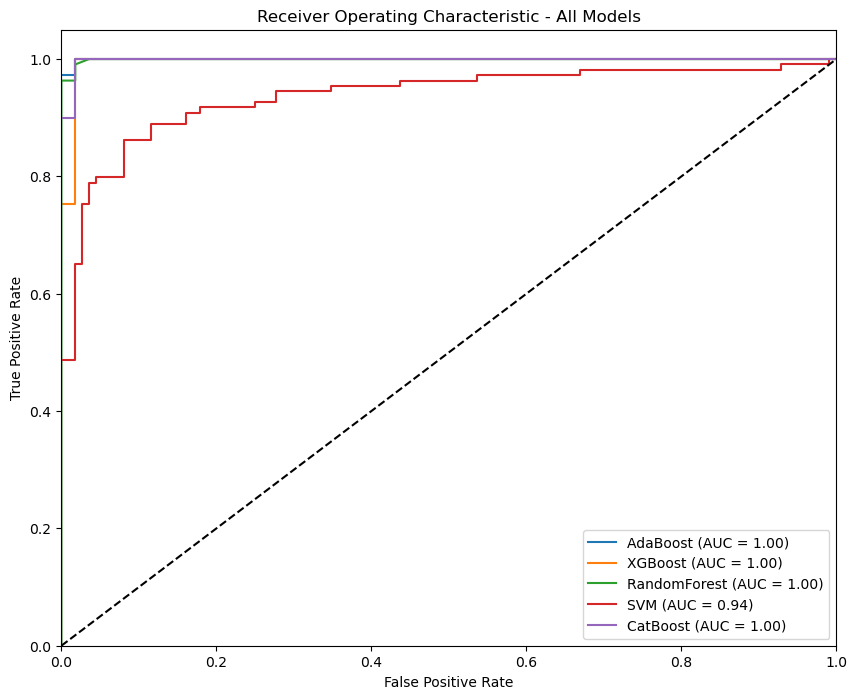

Accuracy of AdaBoost: 0.97
Accuracy of XGBoost: 0.99
Accuracy of RandomForest: 0.99
Accuracy of SVM: 0.87
Accuracy of CatBoost: 0.99


<Figure size 640x480 with 0 Axes>

In [20]:




# Tokenize the text data
def tokenize(texts, max_len=128):
    input_ids = []
    attention_masks = []

    for text in texts:
        encoded = tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=max_len,
            padding='max_length',
            truncation=True,
            return_attention_mask=True
        )

        input_ids.append(encoded['input_ids'])
        attention_masks.append(encoded['attention_mask'])

    return tf.convert_to_tensor(input_ids), tf.convert_to_tensor(attention_masks)

X_train_ids, X_train_masks = tokenize(X_train)
X_test_ids, X_test_masks = tokenize(X_test)

# Convert BERT embeddings to numpy arrays
X_train_embeddings = X_train_ids.numpy()
X_test_embeddings = X_test_ids.numpy()

def train_and_evaluate(model, X_train, y_train, X_test, y_test, model_name, reduction_technique="None"):
    model.fit(X_train, y_train)
    
    # Predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    # Calculate specificity
    tn, fp, fn, tp = conf_matrix.ravel()
    specificity = tn / (tn + fp)

    roc_auc = roc_auc_score(y_test, y_prob)
    fpr, tpr, _ = roc_curve(y_test, y_prob)

    # Print metrics
    print(f'[{model_name} - {reduction_technique}] Accuracy: {accuracy}')
    print(f'[{model_name} - {reduction_technique}] Precision: {precision}')
    print(f'[{model_name} - {reduction_technique}] Recall: {recall}')
    print(f'[{model_name} - {reduction_technique}] F1 Score: {f1}')
    print(f'[{model_name} - {reduction_technique}] Specificity: {specificity}')
    print(f'[{model_name} - {reduction_technique}] Confusion Matrix:\n{conf_matrix}')
    print(f'[{model_name} - {reduction_technique}] ROC AUC: {roc_auc}')

    # Return the ROC curve data and accuracy
    return fpr, tpr, roc_auc, accuracy

# Prepare to plot ROC curves on the same graph
plt.figure(figsize=(10, 8))

# Dictionary to store accuracy for each model
model_accuracies = {}

# Evaluate models without PCA/LDA and store ROC curve values
for name, model in models:
    fpr, tpr, roc_auc, accuracy = train_and_evaluate(model, X_train_embeddings, y_train, X_test_embeddings, y_test, name, "None")
    model_accuracies[name] = accuracy
    
    # Plot ROC curve for this model
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--')

# Finalize the ROC plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - All Models')
plt.legend(loc="lower right")
plt.show()
plt.savefig('roc_curve_all_models.png')  # Save as PNG file
# Print the accuracy for each model
for model_name, accuracy in model_accuracies.items():
    print(f'Accuracy of {model_name}: {accuracy:.2f}')


C:\Users\Jervis\anaconda3\envs\buresearch\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[AdaBoost - None] Accuracy: 0.9728506787330317
[AdaBoost - None] Precision: 0.9478260869565217
[AdaBoost - None] Recall: 1.0
[AdaBoost - None] F1 Score: 0.9732142857142857
[AdaBoost - None] Specificity: 0.9464285714285714
[AdaBoost - None] Confusion Matrix:
[[106   6]
 [  0 109]]
[AdaBoost - None] ROC AUC: 0.9995085190039319
[XGBoost - None] Accuracy: 0.9909502262443439
[XGBoost - None] Precision: 0.9819819819819819
[XGBoost - None] Recall: 1.0
[XGBoost - None] F1 Score: 0.990909090909091
[XGBoost - None] Specificity: 0.9821428571428571
[XGBoost - None] Confusion Matrix:
[[110   2]
 [  0 109]]
[XGBoost - None] ROC AUC: 0.9955766710353866
[RandomForest - None] Accuracy: 0.9864253393665159
[RandomForest - None] Precision: 0.9818181818181818
[RandomForest - None] Recall: 0.9908256880733946
[RandomForest - None] F1 Score: 0.9863013698630136
[RandomForest - None] Specificity: 0.9821428571428571
[RandomForest - None] Confusion Matrix:
[[110   2]
 [  1 108]]
[RandomForest - None] ROC AUC: 0.9

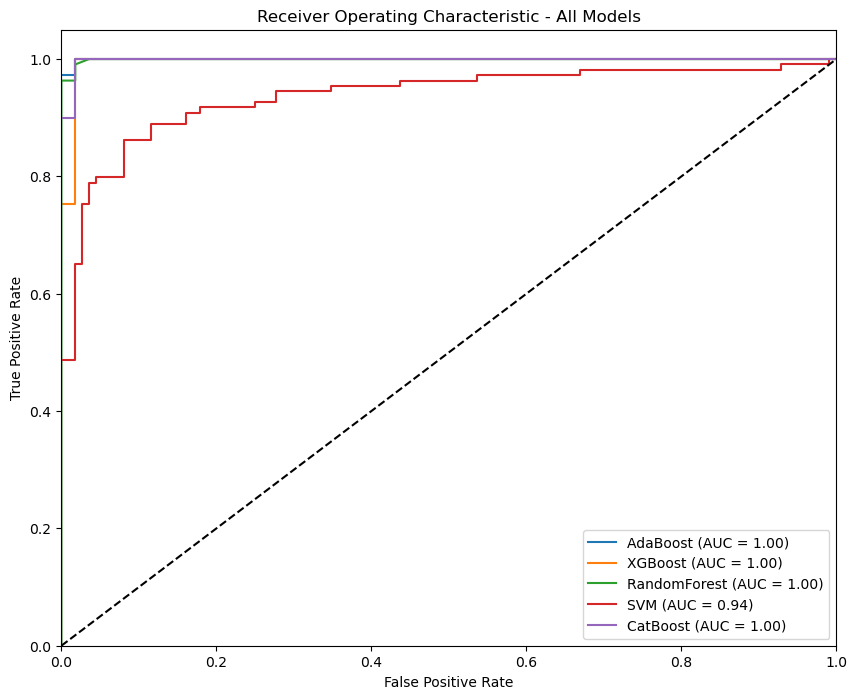

Accuracy of AdaBoost: 0.97
Accuracy of XGBoost: 0.99
Accuracy of RandomForest: 0.99
Accuracy of SVM: 0.87
Accuracy of CatBoost: 0.99


In [22]:
import matplotlib.pyplot as plt  # Ensure you have imported matplotlib

# Prepare to plot ROC curves on the same graph
plt.figure(figsize=(10, 8))

# Dictionary to store accuracy for each model
model_accuracies = {}

# Evaluate models without PCA/LDA and store ROC curve values
for name, model in models:
    fpr, tpr, roc_auc, accuracy = train_and_evaluate(model, X_train_embeddings, y_train, X_test_embeddings, y_test, name, "None")
    model_accuracies[name] = accuracy
    
    # Plot ROC curve for this model
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--')

# Finalize the ROC plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - All Models')
plt.legend(loc="lower right")

# Save the figure
plt.savefig('roc_curve_all_models-1.png')  # Save as PNG file
# plt.savefig('roc_curve_all_models.pdf')  # Optionally save as PDF file

# Show the plot
plt.show()

# Print the accuracy for each model
for model_name, accuracy in model_accuracies.items():
    print(f'Accuracy of {model_name}: {accuracy:.2f}')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


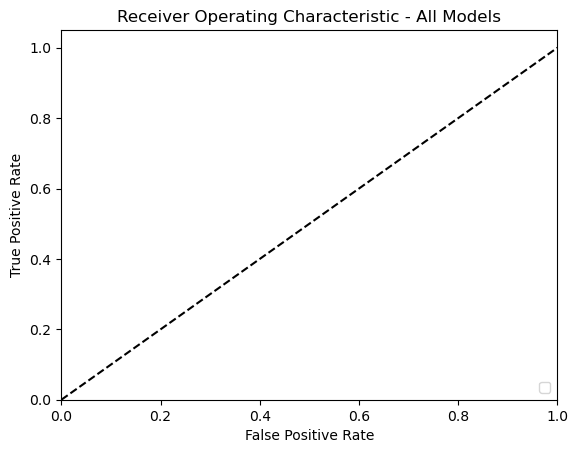